**Library** **Imports**

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

**Upload Data**

In [ ]:
from google.colab import files
files.upload()

Saving test.csv to test (1).csv
Saving train.csv to train (1).csv


{'test.csv': b'Item_ID,Item_W,Item_Type,Item_MRP,Outlet_ID,Outlet_Year,Outlet_Size,Outlet_Location_Type\nDRM23,10.15672519,Snack Foods,119.3194822,OUT013,1999,High,Tier 3\nFDG47,10.43442479,Household,263.6004492,OUT018,1987,High,Tier 3\nFDN21,11.95358857,Health and Hygiene,246.2869904,OUT018,1997,High,Tier 1\nFDZ23,14.94854559,Dairy,136.2005081,OUT046,2004,Medium,Tier 2\nFDC16,11.08004215,Canned,173.14566430000002,OUT018,2009,Medium,Tier 3\nNCE07,17.92604724,Snack Foods,170.7156395,OUT035,1999,High,Tier 1\nFDH27,17.01588701,Canned,129.4291269,OUT013,1987,Medium,Tier 1\nFDL13,17.66789806,Frozen Foods,117.01943929999999,OUT046,1996,Medium,Tier 3\nNCX30,13.42787687,Dairy,237.58090180000002,OUT049,1997,Medium,Tier 2\nFDR35,12.46113259,Health and Hygiene,138.9139895,OUT013,2009,High,Tier 3\nFDZ49,10.57969973,Household,212.6345412,OUT035,1997,Medium,Tier 1\nNCO02,16.52860309,Frozen Foods,153.32775780000003,OUT018,2004,Medium,Tier 3\nFDX09,18.04591744,Snack Foods,190.01144399999998,OUT046,200

In [ ]:
test = pd.read_csv("test.csv")
train = pd.read_csv ("train.csv")

## **Exploratory Analysis** 

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87864 entries, 0 to 87863
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Item_ID               87864 non-null  object 
 1   Item_W                87864 non-null  float64
 2   Item_Type             87864 non-null  object 
 3   Item_MRP              87864 non-null  float64
 4   Outlet_ID             87864 non-null  object 
 5   Outlet_Year           87864 non-null  int64  
 6   Outlet_Size           87864 non-null  object 
 7   Outlet_Location_Type  87864 non-null  object 
 8   Sales                 87864 non-null  float64
dtypes: float64(3), int64(1), object(5)
memory usage: 6.0+ MB


In [ ]:
train.describe()

,Item_W,Item_MRP,Outlet_Year,Sales
count,87864.000000,87864.000000,87864.00000,87864.000000
mean,15.591469,151.242943,1999.87063,1911.842120
std,4.364429,59.536366,6.63429,1291.386004
min,7.992700,32.910015,1987.00000,-1229.360345
25%,10.968658,112.423337,1997.00000,959.249675
50%,15.831170,145.581473,1999.00000,1606.307877
75%,19.969936,197.110367,2004.00000,2608.057736
max,21.250000,265.214271,2009.00000,10309.283310


In [ ]:
train.isnull().sum()

Item_ID                 0
Item_W                  0
Item_Type               0
Item_MRP                0
Outlet_ID               0
Outlet_Year             0
Outlet_Size             0
Outlet_Location_Type    0
Sales                   0
dtype: int64

<function matplotlib.pyplot.show>

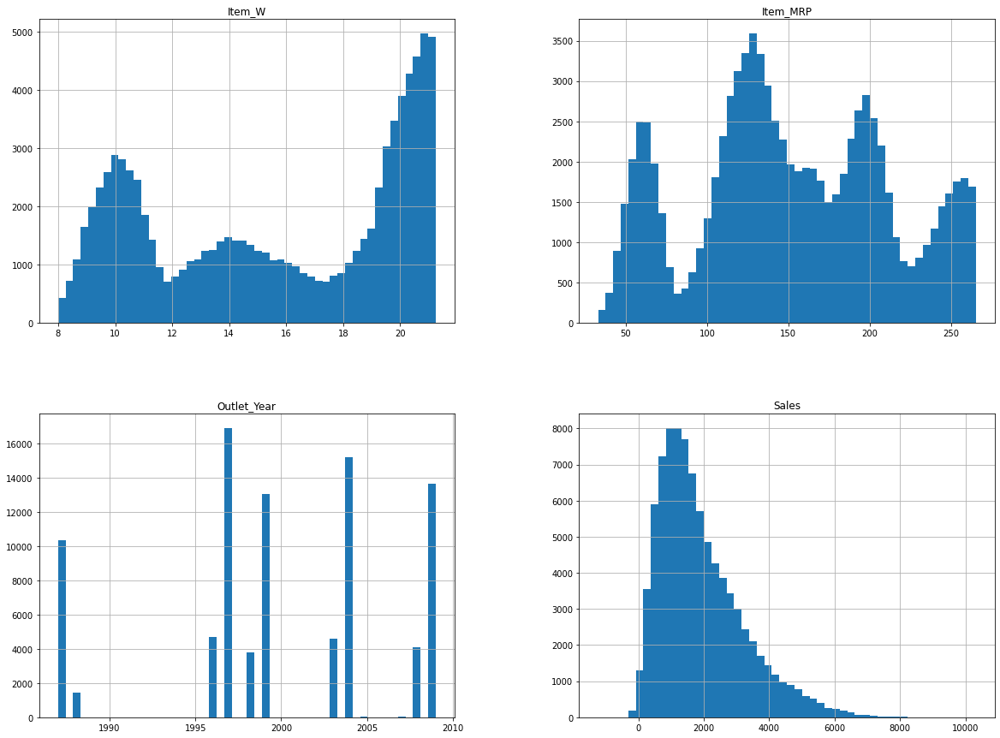

In [ ]:
train.hist(bins=50, figsize=(20,15))
plt.show

**CREATE TEST and TRAIN SET**

In [ ]:
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(train, test_size=0.2, random_state=42)

In [ ]:
# to make this notebook's output identical at every run
np.random.seed(42)

In [ ]:
import numpy as np

# For illustration only. Sklearn has train_test_split()
def split_train_test(data, test_ratio):
    shuffled_indices = np.random.permutation(len(data))
    test_set_size = int(len(data) * test_ratio)
    test_indices = shuffled_indices[:test_set_size]
    train_indices = shuffled_indices[test_set_size:]
    return data.iloc[train_indices], data.iloc[test_indices]

In [ ]:
train_set, test_set = split_train_test(train, 0.2)
len(train_set)

70292

In [ ]:
len(test_set)

17572

In [ ]:
from zlib import crc32

def test_set_check(identifier, test_ratio):
    return crc32(np.int64(identifier)) & 0xffffffff < test_ratio * 2**32

def split_train_test_by_id(data, test_ratio, id_column):
    ids = data[id_column]
    in_test_set = ids.apply(lambda id_: test_set_check(id_, test_ratio))
    return data.loc[~in_test_set], data.loc[in_test_set]

In [ ]:
import hashlib

def test_set_check(identifier, test_ratio, hash=hashlib.md5):
    return hash(np.int64(identifier)).digest()[-1] < 256 * test_ratio

In [ ]:
def test_set_check(identifier, test_ratio, hash=hashlib.md5):
    return bytearray(hash(np.int64(identifier)).digest())[-1] < 256 * test_ratio

In [ ]:
train_with_id = train.reset_index()   # adds an `index` column
train_set, test_set = split_train_test_by_id(train_with_id, 0.2, "index")

In [ ]:
test_set.head()

,index,Item_ID,Item_W,Item_Type,Item_MRP,Outlet_ID,Outlet_Year,Outlet_Size,Outlet_Location_Type,Sales
4,4,FDF47,21.247876,Baking Goods,240.871039,OUT035,1988,Small,Tier 3,1739.769829
5,5,DRK12,20.956395,Baking Goods,130.264868,OUT049,1999,Small,Tier 1,1963.629422
11,11,FDF56,20.965062,Baking Goods,113.604451,OUT049,2004,Small,Tier 2,2138.541883
20,20,DRL01,21.120652,Meat,150.396349,OUT049,1997,Small,Tier 1,4494.872357
23,23,FDX09,21.044138,Baking Goods,255.527530,OUT035,1999,Small,Tier 3,2027.047752


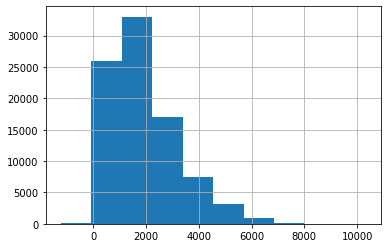

In [ ]:
train["Sales"].hist()

In [ ]:
train["Sales_cat"] = pd.cut(train["Sales"],
                               bins=[-3000., 2000., 3000.0, 4000.0, 5000.0, np.inf],
                               labels=[1, 2, 3, 4, 5])

In [ ]:
train["Sales_cat"].value_counts()

1    54314
2    17485
3     9177
4     4281
5     2607
Name: Sales_cat, dtype: int64

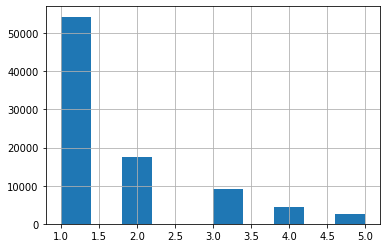

In [ ]:
train["Sales_cat"].hist()

In [ ]:
import pandas as pd

def clean_dataset(df):
    assert isinstance(train, pd.DataFrame), "df needs to be a pd.DataFrame"
    df.dropna(inplace=True)
    indices_to_keep = ~train.isin([np.nan, np.inf, -np.inf]).any(1)
    return train[indices_to_keep].astype(np.float64)

In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit

split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in split.split(train, train["Sales_cat"]):
    strat_train_set = train.loc[train_index]
    strat_test_set = train.loc[test_index]

In [ ]:
strat_test_set["Sales_cat"].value_counts() / len(strat_test_set)

1    0.618164
2    0.198998
3    0.104478
4    0.048711
5    0.029648
Name: Sales_cat, dtype: float64

In [ ]:
train["Sales_cat"].value_counts() / len(train)

1    0.618160
2    0.199001
3    0.104446
4    0.048723
5    0.029671
Name: Sales_cat, dtype: float64

In [ ]:
def Sales_cat_proportions(data):
    return data["Sales_cat"].value_counts() / len(train)

train_set, test_set = train_test_split(train, test_size=0.2, random_state=42)

compare_props = pd.DataFrame({
    "Overall": Sales_cat_proportions(train),
    "Stratified": Sales_cat_proportions(strat_test_set),
    "Random": Sales_cat_proportions(test_set),
}).sort_index()
compare_props["Rand. %error"] = 100 * compare_props["Random"] / compare_props["Overall"] - 100
compare_props["Strat. %error"] = 100 * compare_props["Stratified"] / compare_props["Overall"] - 100

In [ ]:
compare_props

,Overall,Stratified,Random,Rand. %error,Strat. %error
1,0.618160,0.123634,0.122872,-80.122989,-79.999632
2,0.199001,0.039800,0.040415,-79.691164,-80.000000
3,0.104446,0.020896,0.020930,-79.960771,-79.993462
4,0.048723,0.009742,0.009537,-80.425134,-80.004672
5,0.029671,0.005930,0.006248,-78.941312,-80.015343


In [ ]:
for set_ in (strat_train_set, strat_test_set):
    set_.drop("Sales_cat", axis=1, inplace=True)

**Data Vizualization**

In [ ]:
train = strat_train_set.copy()

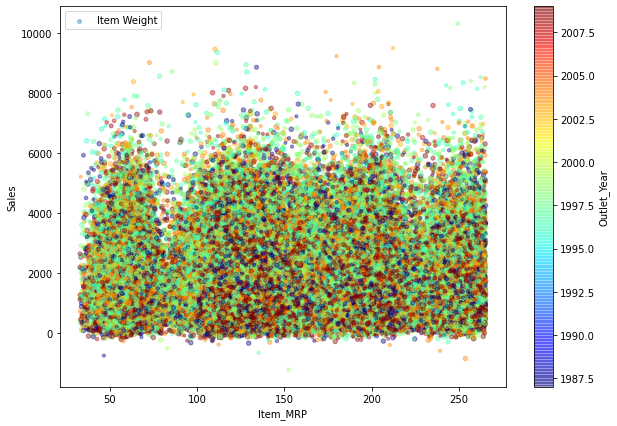

In [ ]:
train.plot(kind="scatter", x="Item_MRP", y="Sales", alpha=0.4,
             s=train["Item_W"]/1, label="Item Weight", figsize=(10,7),
             c="Outlet_Year", cmap=plt.get_cmap("jet"), colorbar=True,
             sharex=False)
plt.legend()

In [ ]:
#Looking for Correlation
corr_matrix= train.corr()
corr_matrix["Sales"].sort_values(ascending=False)

Sales          1.000000
Item_MRP       0.014813
Item_W         0.000615
Outlet_Year   -0.035701
Name: Sales, dtype: float64

**PREPARE THE DATA FOR MACHINE LEARNING**






In [ ]:
#train = strat_train_set.drop("Sales", axis=1) # drop labels for training set
#train_labels = strat_train_set["Sales"].copy()

train = strat_train_set.drop("Sales", axis=1) # drop labels for training set
train_labels = strat_train_set["Sales"].copy()
train_labels

In [ ]:
# Categorical Encoding
train.head()

,Item_ID,Item_W,Item_Type,Item_MRP,Outlet_ID,Outlet_Year,Outlet_Size,Outlet_Location_Type,Sales
0,FDU32,21.027499,Baking Goods,197.352319,OUT046,2004,Small,Tier 2,2689.457781
1,NCT54,21.102371,Meat,148.250214,OUT035,1987,Small,Tier 1,3437.350375
2,FDW08,20.882263,Hard Drinks,205.465010,OUT035,1999,Small,Tier 3,3129.967268
3,FDJ22,21.050435,Starchy Foods,253.417583,OUT046,1996,Small,Tier 1,1306.514376
4,FDF47,21.247876,Baking Goods,240.871039,OUT035,1988,Small,Tier 3,1739.769829


In [ ]:
train_cat1hot = train[["Item_ID","Item_Type","Outlet_ID"]]
train_cat1hot.head(10)

,Item_ID,Item_Type,Outlet_ID
0,FDU32,Baking Goods,OUT046
1,NCT54,Meat,OUT035
2,FDW08,Hard Drinks,OUT035
3,FDJ22,Starchy Foods,OUT046
4,FDF47,Baking Goods,OUT035
5,DRK12,Baking Goods,OUT049
6,FDA32,Breads,OUT035
7,FDH24,Hard Drinks,OUT046
8,FDW03,Baking Goods,OUT049
9,FDE11,Others,OUT018


In [ ]:
from sklearn.preprocessing import OneHotEncoder

cat_encoder = OneHotEncoder()
train_cat_1hot = cat_encoder.fit_transform(train_cat1hot)
train_cat_1hot

<87864x916 sparse matrix of type '<class 'numpy.float64'>'
	with 263592 stored elements in Compressed Sparse Row format>

In [ ]:
cat_encoder.categories_

[array(['DRA12', 'DRA24', 'DRA59', 'DRB13', 'DRB24', 'DRB25', 'DRC12',
        'DRC25', 'DRC27', 'DRD01', 'DRD13', 'DRD24', 'DRD25', 'DRD27',
        'DRD37', 'DRD60', 'DRE12', 'DRE25', 'DRE37', 'DRE48', 'DRE60',
        'DRF01', 'DRF03', 'DRF13', 'DRF15', 'DRF23', 'DRF25', 'DRF27',
        'DRF37', 'DRF49', 'DRF51', 'DRF60', 'DRG01', 'DRG03', 'DRG11',
        'DRG15', 'DRG23', 'DRG25', 'DRG37', 'DRG51', 'DRH03', 'DRH13',
        'DRH23', 'DRH25', 'DRH36', 'DRH37', 'DRH39', 'DRH51', 'DRI03',
        'DRI11', 'DRI23', 'DRI47', 'DRI49', 'DRJ01', 'DRJ13', 'DRJ24',
        'DRJ25', 'DRJ39', 'DRJ47', 'DRJ49', 'DRJ51', 'DRK11', 'DRK12',
        'DRK39', 'DRK47', 'DRK49', 'DRL01', 'DRL11', 'DRL23', 'DRL37',
        'DRL47', 'DRL49', 'DRL60', 'DRM11', 'DRM23', 'DRM37', 'DRM47',
        'DRM49', 'DRM59', 'DRN35', 'DRN37', 'DRN47', 'DRO35', 'DRO47',
        'DRP47', 'DRQ35', 'DRZ11', 'FDA02', 'FDA03', 'FDA04', 'FDA07',
        'FDA08', 'FDA13', 'FDA21', 'FDA22', 'FDA23', 'FDA25', 'FDA26',
      

In [ ]:
train_catlabel = train[["Outlet_Size","Outlet_Location_Type"]]
train_catlabel.head(10)

,Outlet_Size,Outlet_Location_Type
0,Small,Tier 2
1,Small,Tier 1
2,Small,Tier 3
3,Small,Tier 1
4,Small,Tier 3
5,Small,Tier 1
6,Small,Tier 2
7,Small,Tier 2
8,Small,Tier 1
9,Small,Tier 1


In [ ]:
from sklearn.preprocessing import OrdinalEncoder

ordinal_encoder = OrdinalEncoder()
train_cat_label = ordinal_encoder.fit_transform(train_catlabel)
train_cat_label[:10]

array([[2., 1.],
       [2., 0.],
       [2., 2.],
       [2., 0.],
       [2., 2.],
       [2., 0.],
       [2., 1.],
       [2., 1.],
       [2., 0.],
       [2., 0.]])

In [ ]:
ordinal_encoder.categories_

[array(['High', 'Medium', 'Small'], dtype=object),
 array(['Tier 1', 'Tier 2', 'Tier 3'], dtype=object)]

In [ ]:
train_num=train[["Item_W", "Item_MRP", "Sales"]]
train_num.head()

,Item_W,Item_MRP,Sales
0,21.027499,197.352319,2689.457781
1,21.102371,148.250214,3437.350375
2,20.882263,205.465010,3129.967268
3,21.050435,253.417583,1306.514376
4,21.247876,240.871039,1739.769829


In [ ]:
train_num
train_cat_label
train_cat_1hot

<87864x916 sparse matrix of type '<class 'numpy.float64'>'
	with 263592 stored elements in Compressed Sparse Row format>

In [ ]:
train_num.head()

,Item_W,Item_MRP,Sales
0,21.027499,197.352319,2689.457781
1,21.102371,148.250214,3437.350375
2,20.882263,205.465010,3129.967268
3,21.050435,253.417583,1306.514376
4,21.247876,240.871039,1739.769829


In [ ]:
train_cat_label

array([[2., 1.],
       [2., 0.],
       [2., 2.],
       ...,
       [1., 0.],
       [1., 2.],
       [1., 2.]])

In [ ]:
train_cat_1hot.toarray()

array([[0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

**CUSTOM PIPELINE**


Transformation Pipelines
Now let's build a pipeline for preprocessing the numerical attributes:

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

num_pipeline = Pipeline([
        ('std_scaler', StandardScaler()),
    ])

train_num_tr = num_pipeline.fit_transform(train_num)
train_num_tr

array([[ 1.2455376 ,  0.77447855,  0.6021593 ],
       [ 1.26269259, -0.05026753,  1.18130205],
       [ 1.21226021,  0.91074378,  0.94327496],
       ...,
       [-0.96362688, -0.54108483,  0.62275765],
       [ 0.55598855,  1.21226387, -0.71240521],
       [ 0.35258442, -0.13455542,  1.81881228]])

**CUSTOM TRANSFORMER & PIPELINES**

In [ ]:
from sklearn.compose import ColumnTransformer

num_attribs = list(train_num)
cat_attribs_label = ["Outlet_Size","Outlet_Location_Type"]
cat_attribs_1hot = ["Item_ID","Item_Type","Outlet_ID"]

full_pipeline = ColumnTransformer([
        ("num", num_pipeline, num_attribs),
        ("catlab", OrdinalEncoder(), cat_attribs_label),
        ("cat1hot", OneHotEncoder(), cat_attribs_1hot),
    ])

train_prepared = full_pipeline.fit_transform(train)
train_prepared

<87864x921 sparse matrix of type '<class 'numpy.float64'>'
	with 656778 stored elements in Compressed Sparse Row format>

In [ ]:
train_prepared.shape

(70291, 920)

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin

# Create a class to select numerical or categorical columns 
class OldDataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names].values

In [ ]:
num_attribs = list(train_num)
cat_attribs_label = ["Outlet_Size","Outlet_Location_Type"]
cat_attribs_1hot = ["Item_ID","Item_Type","Outlet_ID"]


old_num_pipeline = Pipeline([
        ('selector', OldDataFrameSelector(num_attribs)),
        ('std_scaler', StandardScaler()),
    ])

old_cat_pipeline = Pipeline([
        ('selector', OldDataFrameSelector(cat_attribs_1hot)),
        ('cat_encoder', OneHotEncoder(sparse=False)),
        ('selector1', OldDataFrameSelector(cat_attribs_label)),
        ('Ordinal_encoder', OrdinalEncoder())
])

In [ ]:
from sklearn.pipeline import FeatureUnion

old_full_pipeline= FeatureUnion(transformer_list=[
        ("num_pipeline", old_num_pipeline),
        ("cat_pipeline", old_cat_pipeline),
    ])

In [ ]:
#old_train_prepared = old_full_pipeline.fit_transform(train)
#old_train_prepared

In [ ]:
#np.allclose(train_prepared, old_train_prepared)

Select and Train a Model

PREPARE TRAIN LABEL

13198    1839.964873
41436    2620.227748
75803    1682.598936
55023    1624.740071
61625     792.642788
            ...     
8943     2445.242115
12408    1343.321793
5749     2120.433431
9061      668.390417
20623     148.712499
Name: Sales, Length: 70291, dtype: float64

**LINEAR REGRESSION**

In [ ]:
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()
lin_reg.fit(train_prepared, train_labels)

ValueError: ignored

In [ ]:
# let's try the full preprocessing pipeline on a few training instances
some_data = train.iloc[:5]
some_labels = train_labels.iloc[:5]
some_data_prepared = full_pipeline.transform(some_data)

print("Predictions:", lin_reg.predict(some_data_prepared))

ValueError: ignored

In [ ]:
print("Labels:", list(some_labels))

Labels: [1839.964873, 2620.227748, 1682.598936, 1624.7400710000004, 792.6427876]


In [ ]:
some_data_prepared

<5x920 sparse matrix of type '<class 'numpy.float64'>'
	with 37 stored elements in Compressed Sparse Row format>

In [ ]:
from sklearn.metrics import mean_squared_error

train_predictions = lin_reg.predict(train_prepared)
lin_mse = mean_squared_error(train_labels, train_predictions)
lin_rmse = np.sqrt(lin_mse)
lin_rmse

9.203004434473729e-05

In [ ]:
from sklearn.metrics import mean_absolute_error

lin_mae = mean_absolute_error(train_labels, train_predictions)
lin_mae

2.396899658557776e-05

Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeRegressor

tree_reg = DecisionTreeRegressor(random_state=42)
tree_reg.fit(train_prepared, train_labels)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=42, splitter='best')

In [ ]:
train_predictions = tree_reg.predict(train_prepared)
tree_mse = mean_squared_error(train_labels, train_predictions)
tree_rmse = np.sqrt(tree_mse)
tree_rmse

2.7911358408186763e-05

Better Evaluation Using Cross-Validation

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(tree_reg, train_prepared, train_labels,
                         scoring="neg_mean_squared_error", cv=10)
tree_rmse_scores = np.sqrt(-scores)



In [ ]:
def display_scores(scores):
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())

display_scores(tree_rmse_scores)

Scores: [ 4.34216607  2.4885085   1.28810441  0.54294148  2.29808554  1.86193254
  6.95671341  3.65584202 10.48243774  3.61269218]
Mean: 3.752942388036794
Standard deviation: 2.8213009663281325


In [ ]:
lin_scores = cross_val_score(lin_reg, train_prepared, train_labels,
                             scoring="neg_mean_squared_error", cv=10)
lin_rmse_scores = np.sqrt(-lin_scores)
display_scores(lin_rmse_scores)

Scores: [5.59278388e-05 1.50252130e-04 7.98264107e-05 5.78924652e-05
 8.26699676e-05 8.67306550e-05 8.84188091e-05 5.37364482e-05
 7.53370699e-05 1.65985644e-04]
Mean: 8.967774380953052e-05
Standard deviation: 3.6462818674300556e-05


RANDOM FORREST

In [ ]:
from sklearn.ensemble import RandomForestRegressor

forest_reg = RandomForestRegressor(n_estimators=100, random_state=42)
forest_reg.fit(train_prepared, train_labels)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=42, verbose=0, warm_start=False)

In [ ]:
train_predictions = forest_reg.predict(train_prepared)
forest_mse = mean_squared_error(train_labels, train_predictions)
forest_rmse = np.sqrt(forest_mse)
forest_rmse

In [ ]:
from sklearn.model_selection import cross_val_score

forest_scores = cross_val_score(forest_reg, train_prepared, train_labels,
                                scoring="neg_mean_squared_error", cv=10)
forest_rmse_scores = np.sqrt(-forest_scores)
display_scores(forest_rmse_scores)

In [ ]:
scores = cross_val_score(lin_reg, train_prepared, train_labels, scoring="neg_mean_squared_error", cv=10)
pd.Series(np.sqrt(-scores)).describe()

SVM 

In [ ]:
from sklearn.svm import SVR

svm_reg = SVR(kernel="linear")
svm_reg.fit(train_prepared, train_labels)
housing_predictions = svm_reg.predict(train_prepared)
svm_mse = mean_squared_error(train_labels, train_predictions)
svm_rmse = np.sqrt(svm_mse)
svm_rmse

GRID SEARCH

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = [
    # try 12 (3×4) combinations of hyperparameters
    {'n_estimators': [3, 10, 30], 'max_features': [2, 4, 6, 8]},
    # then try 6 (2×3) combinations with bootstrap set as False
    {'bootstrap': [False], 'n_estimators': [3, 10], 'max_features': [2, 3, 4]},
  ]

forest_reg = RandomForestRegressor(random_state=42)
# train across 5 folds, that's a total of (12+6)*5=90 rounds of training 
grid_search = GridSearchCV(forest_reg, param_grid, cv=5,
                           scoring='neg_mean_squared_error',
                           return_train_score=True)
grid_search.fit(train_prepared, train_labels)

In [ ]:
grid_search.best_params_

In [ ]:
grid_search.best_estimator_